# Comparing Image Synthesis of Different Diffusion Models

## Packages and Presets

In [ ]:
import torch
import time
import os
from tqdm.auto import tqdm
from diffusers import (
    StableDiffusionPipeline,
    StableDiffusionXLPipeline,
    AutoPipelineForText2Image,  # SD Turbo
    DDIMScheduler,
)
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec

os.makedirs("results", exist_ok=True)

## Plotting Generation at Different Steps

In [ ]:
def generate_step_comparison(
    prompt, step_counts=[5, 10, 15, 25, 50], seed=42  # noqa:B006
):
    """
    Generate a comparison of image quality across different step counts
    for Stable Diffusion 1.4, 2.1, SDXL, and SD Turbo using the same prompt.

    Args:
        prompt (str): The text prompt to use for generation across all models
        step_counts (list): List of step counts to compare
        seed (int): Random seed for reproducibility

    Returns:
        tuple: (dict containing results, list of step counts used for non-Turbo
               models)
               The results dict contains images and timing information.
               SD Turbo uses a hardcoded list of steps [1, 2, 4].
    """
    device = "cuda" if torch.cuda.is_available() else "cpu"
    print(f"Using device: {device}")

    # Hardcoded steps for SD Turbo
    sd_turbo_steps = [1, 2, 3, 4]

    # Dictionary to store results
    results = {
        "SD 1.4": {"images": [], "times": []},
        "SD 2.1": {"images": [], "times": []},
        "SDXL": {"images": [], "times": []},
        "SD Turbo": {"images": [], "times": []},
    }

    # -------------------------------------------------------------------------
    # Stable Diffusion 1.4
    # -------------------------------------------------------------------------
    print("Loading SD 1.4...")
    sd14 = StableDiffusionPipeline.from_pretrained(
        "CompVis/stable-diffusion-v1-4",
        torch_dtype=torch.float16,
        safety_checker=None,
    )
    # Set DDIM scheduler
    sd14.scheduler = DDIMScheduler.from_config(sd14.scheduler.config)
    sd14 = sd14.to(device)

    print("Generating SD 1.4 images...")
    for steps in tqdm(step_counts, desc="SD 1.4 Steps"):
        generator = torch.Generator(device=device).manual_seed(seed)

        start_time = time.time()
        image = sd14(
            prompt,
            num_inference_steps=steps,
            generator=generator,
            guidance_scale=9.0,
            height=512,
            width=512,
        ).images[0]
        end_time = time.time()

        results["SD 1.4"]["images"].append(image)
        results["SD 1.4"]["times"].append(end_time - start_time)

    # Clear VRAM
    del sd14
    torch.cuda.empty_cache()

    # -------------------------------------------------------------------------
    # Stable Diffusion 2.1
    # -------------------------------------------------------------------------
    print("Loading SD 2.1...")
    sd21 = StableDiffusionPipeline.from_pretrained(
        "stabilityai/stable-diffusion-2-1",
        torch_dtype=torch.float16,
        safety_checker=None,
    )
    sd21.scheduler = DDIMScheduler.from_config(sd21.scheduler.config)
    sd21 = sd21.to(device)

    print("Generating SD 2.1 images...")
    for steps in tqdm(step_counts, desc="SD 2.1 Steps"):
        generator = torch.Generator(device=device).manual_seed(seed)

        start_time = time.time()
        image = sd21(
            prompt,
            num_inference_steps=steps,
            generator=generator,
            guidance_scale=9.0,
            height=512,  # SD 2.1 prefers 768, but keeping 512 for consistency
            width=512,
        ).images[0]
        end_time = time.time()

        results["SD 2.1"]["images"].append(image)
        results["SD 2.1"]["times"].append(end_time - start_time)

    # Clear VRAM
    del sd21
    torch.cuda.empty_cache()

    # -------------------------------------------------------------------------
    # Stable Diffusion XL
    # -------------------------------------------------------------------------
    print("Loading SDXL...")
    sdxl = StableDiffusionXLPipeline.from_pretrained(
        "stabilityai/stable-diffusion-xl-base-1.0",
        torch_dtype=torch.float16,
        safety_checker=None,
    )
    # Set DDIM scheduler
    sdxl.scheduler = DDIMScheduler.from_config(sdxl.scheduler.config)
    sdxl = sdxl.to(device)

    # Generate SDXL images
    print("Generating SDXL images... Using 512x512 resolution for comparison")
    for steps in tqdm(step_counts, desc="SDXL Steps"):
        generator = torch.Generator(device=device).manual_seed(seed)

        start_time = time.time()
        image = sdxl(
            prompt,
            num_inference_steps=steps,
            generator=generator,
            guidance_scale=9.0,
            height=512,  # SDXL prefers 1024, but keeping 512 for consistency
            width=512,
        ).images[0]
        end_time = time.time()

        results["SDXL"]["images"].append(image)
        results["SDXL"]["times"].append(end_time - start_time)

    # Clear VRAM
    del sdxl
    torch.cuda.empty_cache()

    # -------------------------------------------------------------------------
    # SD Turbo
    # -------------------------------------------------------------------------
    print("Loading SD Turbo...")
    sdturbo = AutoPipelineForText2Image.from_pretrained(
        "stabilityai/sd-turbo",
        torch_dtype=torch.float16,
        safety_checker=None,
    )
    # DDIM for comparability
    sdturbo.scheduler = DDIMScheduler.from_config(sdturbo.scheduler.config)
    sdturbo = sdturbo.to(device)

    # hardcode fewer steps
    print("Generating SD Turbo images...")
    for steps in tqdm(sd_turbo_steps, desc="SD Turbo Steps"):
        generator = torch.Generator(device=device).manual_seed(seed)

        start_time = time.time()
        # SD Turbo requires num_inference_steps <= 4 and guidance_scale=0.0
        image = sdturbo(
            prompt,
            num_inference_steps=steps,
            generator=generator,
            guidance_scale=0.0,
            height=512,
            width=512,
        ).images[0]
        end_time = time.time()

        results["SD Turbo"]["images"].append(image)
        results["SD Turbo"]["times"].append(end_time - start_time)

    # Clear VRAM
    del sdturbo
    torch.cuda.empty_cache()

    return (
        results,
        step_counts,
    )


def plot_comparison(results, step_counts, prompt, save_path=None):
    """
    Create a comparison visualization of the generated images.
    Handles SD Turbo having fewer steps than other models.

    Args:
        results (dict): Dictionary with generation results from
        generate_step_comparison
        step_counts (list): List of step counts used for non-Turbo models
        prompt (str): The prompt used for generation
        save_path (str, optional): Path to save the figure
    """
    # Hardcoded steps for SD Turbo
    sd_turbo_steps = [1, 2, 3, 4]

    model_names = list(results.keys())
    n_models = len(model_names)
    n_cols = len(step_counts)

    fig = plt.figure(figsize=(max(18, 3.5 * n_cols), 4 * n_models))
    gs = GridSpec(n_models, n_cols, figure=fig)

    for model_idx, model_name in enumerate(model_names):
        is_turbo = model_name == "SD Turbo"
        current_model_steps = sd_turbo_steps if is_turbo else step_counts
        num_images_to_plot = len(results[model_name]["images"])
        for step_idx in range(num_images_to_plot):
            # don't access out of bounds for Turbo
            if step_idx >= n_cols:
                print(
                    f"Warning: Skipping plot for {model_name} step index "
                    f"{step_idx} as it exceeds grid width {n_cols}"
                )
                continue

            ax = fig.add_subplot(gs[model_idx, step_idx])
            ax.imshow(results[model_name]["images"][step_idx])

            time_taken = results[model_name]["times"][step_idx]
            ax.text(
                5,
                15,
                f"{time_taken:.2f}s",
                color="white",
                fontsize=10,
                bbox=dict(facecolor="black", alpha=0.6),
            )

            steps = current_model_steps[step_idx]
            ax.set_title(f"{model_name} - {steps} steps", fontsize=10)
            ax.axis("off")

    # Empty axes for if Turbo has fewer images than others
    for model_idx, model_name in enumerate(model_names):
        if model_name == "SD Turbo":
            num_images_plotted = len(results[model_name]["images"])
            for step_idx in range(num_images_plotted, n_cols):
                ax = fig.add_subplot(gs[model_idx, step_idx])
                ax.axis("off")

    prompt_text = f'Prompt: "{prompt}"\nScheduler: DDIM (Guidance Scale: 9.0, except SD Turbo: 0.0)'  # noqa: E501
    plt.figtext(
        0.5,
        0.01,
        prompt_text,
        ha="center",
        fontsize=12,
        wrap=True,  # Allow prompt text to wrap
        bbox=dict(facecolor="white", alpha=0.8),
    )

    plt.suptitle(
        "Comparison of SD 1.4 vs SD 2.1 vs SDXL vs SD Turbo across different step counts",  # noqa: E501
        fontsize=16,
        y=0.99,
    )
    plt.tight_layout(rect=[0, 0.03, 1, 0.97])

    if save_path:
        # Ensure directory exists before saving
        os.makedirs(os.path.dirname(save_path), exist_ok=True)
        plt.savefig(save_path, dpi=300, bbox_inches="tight")
        print(f"Saved figure to {save_path}")

    plt.show()


def run_comparison(
    prompt,
    step_counts=[5, 10, 15, 25, 50],  # noqa: B006
    seed=42,
    save_path=None,
):
    """
    Run a full comparison with the given prompt and settings, including
    SD Turbo.

    Args:
        prompt (str): The prompt to use for all models
        step_counts (list): List of step counts to compare
            (for non-Turbo models)
        seed (int): Random seed for reproducibility
        save_path (str, optional): Path to save the figure. If None,
            generates a default path.
    """
    results, gen_step_counts = generate_step_comparison(
        prompt, step_counts, seed
    )

    if save_path is None:
        # Use first few words for filename
        prompt_words = prompt.split()[:6]
        safe_prompt = "".join(
            c for c in "_".join(prompt_words) if c.isalnum() or c in ["_", "-"]
        ).rstrip()
        filename = f"sd_comparison_{safe_prompt}.png"
        save_path = os.path.join("results", filename)
    plot_comparison(results, gen_step_counts, prompt, save_path=save_path)

    return results



Running comparison 1/2
Using device: cuda
Loading SD 1.4...


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


Generating SD 1.4 images...


SD 1.4 Steps:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Loading SD 2.1...


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Generating SD 2.1 images...


SD 2.1 Steps:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Loading SDXL...


Keyword arguments {'safety_checker': None} are not expected by StableDiffusionXLPipeline and will be ignored.


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Generating SDXL images... Using 512x512 resolution for comparison


SDXL Steps:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Loading SD Turbo...


Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


Generating SD Turbo images...


SD Turbo Steps:   0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Saved figure to results/sd_comparison_A_vendor_wearing_an_apron_at.png


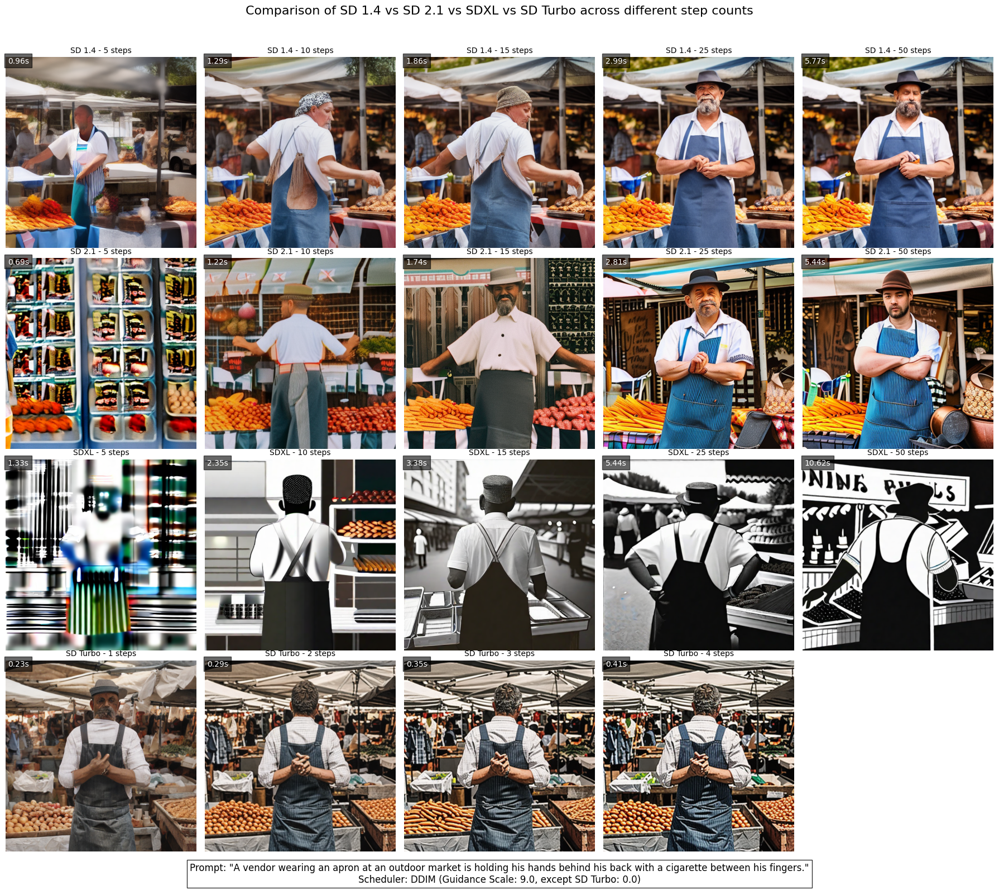



Running comparison 2/2
Using device: cuda
Loading SD 1.4...


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


Generating SD 1.4 images...


SD 1.4 Steps:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Loading SD 2.1...


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Generating SD 2.1 images...


SD 2.1 Steps:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Loading SDXL...


Keyword arguments {'safety_checker': None} are not expected by StableDiffusionXLPipeline and will be ignored.


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Generating SDXL images... Using 512x512 resolution for comparison


SDXL Steps:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Loading SD Turbo...


Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


Generating SD Turbo images...


SD Turbo Steps:   0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Saved figure to results/sd_comparison_a_photo_of_a_cat_photography.png


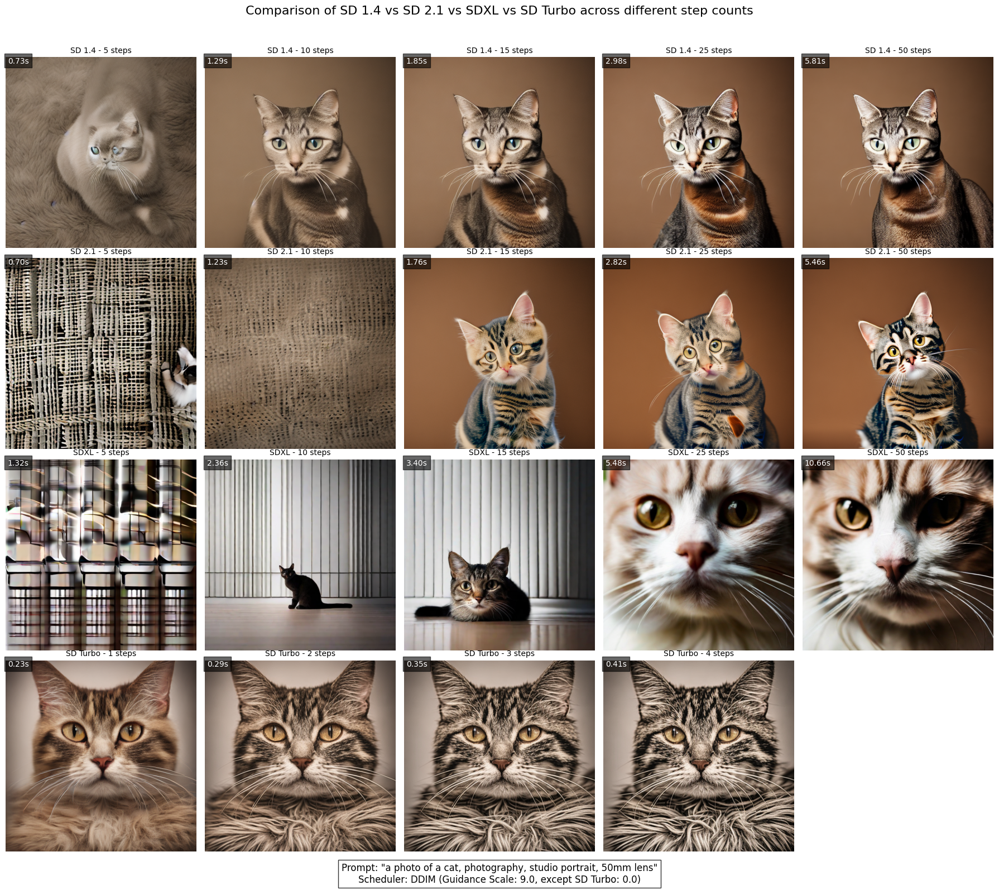

In [ ]:
prompts = [
    "A vendor wearing an apron at an outdoor market is holding his hands behind his back with a cigarette between his fingers.",  # noqa: E501
    "a photo of a cat, photography, studio portrait, 50mm lens",
]

step_counts = [5, 10, 15, 25, 50]
seed = 42


for i, prompt in enumerate(prompts):
    print(f"\n\nRunning comparison {i+1}/{len(prompts)}")
    run_comparison(prompt, step_counts, seed)